### Memory Tunning:
- Because of the in-memory nature of most Spark computations, Spark programs can be bottlenecked by any resource in the cluster: CPU, network bandwidth, or memory. 
- If the **data fits in memory**, the bottleneck is **network bandwidth**, but sometimes, **you also need to do some tuning, such as storing RDDs in serialized form, to decrease memory usage**. 
- Use Data serialization for good network performance and can also reduce memory use, and memory tuning for better memory performance.
- In distributed systems, data transfer over the network is the most common task. If this is not handled efficiently, you may end up facing numerous problems, like high memory usage, network bottlenecks, and performance issues.

#### What is data serialization ?
- Serialization refers to converting objects into a stream of bytes and vice-versa (de-serialization) in an optimal way to transfer it over nodes of network or store it in a file/memory buffer.
 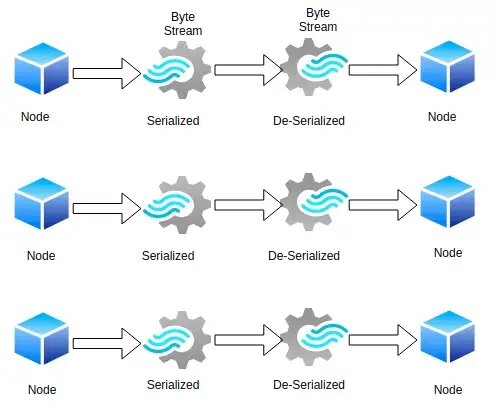
- Spark provides two serialization libraries:
   - Java serialization:
      - Default
      - Spark serializes objects using Java’s ObjectOutputStream framework, and can work with any class you create that implements java.io.Serializable.
      - You can also control the performance of your serialization more closely by extending java.io.Externalizable. Java serialization is flexible but often quite slow, and leads to large serialized formats for many classes.
   - Kryo serialization:
     -  Kryo is significantly faster and more compact than Java serialization (often as much as 10x), but does not support all Serializable types and requires you to register the classes you’ll use in the program in advance for best performance.
     - You can switch to using Kryo by initializing your job with a SparkConf and calling conf.set("spark.serializer", "org.apache.spark.serializer.KryoSerializer"). 
     - Since Spark 2.0.0,internally use Kryo serializer when shuffling RDDs with simple types, arrays of simple types, or string type.

- Finally, you can follow these guidelines by Databricks to avoid serialization issues:

  - Make the object/class serializable.
  - Declare the instance within the lambda function.
  - Declare functions inside an object as much as possible.
  - Redefine variables provided to class constructors inside functions.


#### How to achieve memory tuning? 
- Tunning means adjusting settings to record for memory, cores, and instances used by the system.
- There are three considerations in tuning memory usage
  1. The amount of memory used by your objects
  2. The cost of accessing those objects
  3. The overhead of garbage collection 
- By default, Java objects are fast to access, but can easily consume a factor of 2-5x more space than the “raw” data inside their fields.
- This is due to several reasons:
  - Each distinct Java object has an “object header”, which is about 16 bytes and contains information such as a pointer to its class. For an object with very little data in it (say one Int field), this can be bigger than the data.
  - Java Strings have about 40 bytes of overhead over the raw string data (since they store it in an array of Chars and keep extra data such as the length), and store each character as two bytes due to String’s internal usage of UTF-16 encoding. Thus a 10-character string can easily consume 60 bytes.
  - Common collection classes, such as HashMap and LinkedList, use linked data structures, where there is a “wrapper” object for each entry (e.g. Map.Entry). This object not only has a header, but also pointers (typically 8 bytes each) to the next object in the list.
  - Collections of primitive types often store them as “boxed” objects such as java.lang.Integer.


#### Memory Management Overview:
- Memory usage in Spark largely falls under one of two categories: 
   1. Execution
   2. Storage
- Execution memory refers to that used for computation in shuffles, joins, sorts and aggregations
- Storage memory refers to that used for caching and propagating internal data across the cluster.
- In Spark, execution and storage share a unified region (M). When no execution memory is used, storage can acquire all the available memory and vice versa.
- Execution may evict storage if necessary, but only until total storage memory usage falls under a certain threshold (R).
-  R describes a subregion within M where cached blocks are never evicted. Storage may not evict execution due to complexities in implementation.
- This design ensures several desirable properties. First, applications that do not use caching can use the entire space for execution, obviating unnecessary disk spills. Second, applications that do use caching can reserve a minimum storage space (R) where their data blocks are immune to being evicted. Lastly, this approach provides reasonable out-of-the-box performance for a variety of workloads without requiring user expertise of how memory is divided internally.
- Although there are two relevant configurations, the typical user should not need to adjust them as the default values are applicable to most workloads:
  1. **spark.memory.fraction** expresses the size of M as a fraction of the (JVM heap space - 300MiB) (default 0.6). The rest of the space (40%) is reserved for user data structures, internal metadata in Spark, and safeguarding against OOM errors in the case of sparse and unusually large records.
  2. **spark.memory.storageFraction** expresses the size of R as a fraction of M (default 0.5). R is the storage space within M where cached blocks immune to being evicted by execution.

#### What is large number of small files problem?
- When Spark is loading data to object storage systems like HDFS, S3 etc, it can result in large number of small files. This is mainly because Spark is a parallel processing system and data loading is done through multiple tasks where each task can load into multiple partitions.
- For example, if spark.sql.shuffle.partitions is set to 200 and "partition by" is used to load into say 50 target partitions then, there will be 200 loading tasks, each task can potentially load into 50 partitions which means each load will create around 200*50=10000 files. If you are loading 4 times a day it will result into 40K files per day.

#### Why large number of small files is a problem?
- Query performance :Metadata overhead
- Query performance :Skewed tasks 
- Name node overheads - Namenode needs to keep more metadata on heap, it has to cater to more requests
#### How to avoid this?
- Repartitions on "partitionby" keys
- Repartition on a derived column
- Reduce parallelism




In [1]:
import pyspark
from pyspark import SparkContext, SparkConf
from pyspark.sql.types import *
from pyspark.sql import SparkSession
from pyspark.sql.functions import *
import os
import math
import numpy as np
import pandas as pd
from time import time, ctime
import pyarrow


In [2]:
spark = SparkSession \
    .builder \
    .master("spark://Kirtis-MBP.attlocal.net:7077") \
    .appName("SparkSmallFileDemo") \
    .config("spark.executor.memory",'2g') \
    .getOrCreate()


Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


23/01/13 11:33:56 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [3]:
spark

In [6]:
## Version Information
print("Spark", spark.version)
print("Hadoop",spark.sparkContext._jvm.org.apache.hadoop.util.VersionInfo.getVersion())
print()

! python --version
print("PyArrow",pyarrow.__version__)
print("Pandas",pd.__version__)
print("NumPy",np.__version__)
print()

! java -version

Spark 3.3.0
Hadoop 3.3.2

Python 3.9.7
PyArrow 10.0.1
Pandas 1.4.2
NumPy 1.21.5

java version "18.0.1.1" 2022-04-22
Java(TM) SE Runtime Environment (build 18.0.1.1+2-6)
Java HotSpot(TM) 64-Bit Server VM (build 18.0.1.1+2-6, mixed mode, sharing)


In [4]:
## Verify that we are accessing the data file

#data_folder = "../spark-labs-python/data"
data_folder = "../spark_curriculum/moredata/timeData"
data_path = data_folder + "/timeStampWords.txt"

print(f"The file at `{data_path}` {'exists' if os.path.isfile(data_path) else 'does NOT exist! Check your path'}.")

The file at `../spark_curriculum/moredata/timeData/timeStampWords.txt` exists.


In [14]:
for i in range(20):
    timedDf=spark.read.text(data_path)
    timedDf.show()

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+



+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+



+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

In [13]:
timedDf.show()

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+



In [16]:
timedDf.rdd.getNumPartitions()

1

In [17]:
timedDf.repartition(50)

DataFrame[value: string]

In [18]:
for i in range(20):
    timedDf=spark.read.text(data_path)
    timedDf.show()

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

In [19]:
for i in range(200):
    timedDf=spark.read.text(data_path)
    timedDf.show()

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

In [21]:
#Number of partitions are 1,hence create 20000 files in metadata
for i in range(20000):
    timedDf=spark.read.text(data_path)
    timedDf.show()

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

ERROR:root:KeyboardInterrupt while sending command.
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.9/site-packages/py4j/java_gateway.py", line 1038, in send_command
    response = connection.send_command(command)
  File "/opt/anaconda3/lib/python3.9/site-packages/py4j/clientserver.py", line 511, in send_command
    answer = smart_decode(self.stream.readline()[:-1])
  File "/opt/anaconda3/lib/python3.9/socket.py", line 704, in readinto
    return self._sock.recv_into(b)
KeyboardInterrupt


+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+



KeyboardInterrupt: 

In [22]:
timedDf.rdd.getNumPartitions()

1

In [23]:
#Setting shuffle partitions to 100 .By default is 200
spark.conf.set("spark.sql.shuffle.partitions",100)

In [24]:
for i in range(20000):
    timedDf=spark.read.text(data_path)
    timedDf.show()

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

ERROR:root:KeyboardInterrupt while sending command.
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.9/site-packages/py4j/java_gateway.py", line 1038, in send_command
    response = connection.send_command(command)
  File "/opt/anaconda3/lib/python3.9/site-packages/py4j/clientserver.py", line 511, in send_command
    answer = smart_decode(self.stream.readline()[:-1])
  File "/opt/anaconda3/lib/python3.9/socket.py", line 704, in readinto
    return self._sock.recv_into(b)
KeyboardInterrupt


+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

KeyboardInterrupt: 

In [28]:
timeDf=timedDf.repartition(50)

In [29]:
for i in range(2000):
    timedDf=spark.read.text(data_path)
    timedDf.show()

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

In [30]:
timeDf.rdd.getNumPartitions()

50

In [31]:
#loads 20000*50 files in Metadata which is unwanted burdon on system.Reduce the partitions
for i in range(20000):
    timedDf=spark.read.text(data_path)
    timedDf.show()

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-

ERROR:root:KeyboardInterrupt while sending command.
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.9/site-packages/py4j/java_gateway.py", line 1038, in send_command
    response = connection.send_command(command)
  File "/opt/anaconda3/lib/python3.9/site-packages/py4j/clientserver.py", line 511, in send_command
    answer = smart_decode(self.stream.readline()[:-1])
  File "/opt/anaconda3/lib/python3.9/socket.py", line 704, in readinto
    return self._sock.recv_into(b)
KeyboardInterrupt


+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+

+--------------------+
|               value|
+--------------------+
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:43:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:44:...|
|2021-03-11T15:45:...|
|2021-03-11T15:45:...|
|2021-03-11T15:46:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:47:...|
|2021-03-11T15:43:...|
+--------------------+



KeyboardInterrupt: 